In [1]:
%cd ../

/home/zulqarnain/develop/htfatorch


In [2]:
import logging
import numpy as np
import htfa_torch.dtfa as DTFA
import htfa_torch.niidb as niidb
import htfa_torch.utils as utils

/home/zulqarnain/anaconda3/envs/htfatorch/lib/python3.7/site-packages/sklearn/externals/joblib/__init__.py:15: DeprecationWarning: sklearn.externals.joblib is deprecated in 0.21 and will be removed in 0.23. Please import this functionality directly from joblib, which can be installed with: pip install joblib. If this warning is raised when loading pickled models, you may need to re-serialize those models with scikit-learn 0.21+.
  warnings.warn(msg, category=DeprecationWarning)


In [3]:
from scipy.spatial import distance
from scipy import stats
import nilearn.plotting as niplot
import statsmodels.stats.multitest as smt

In [4]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

In [5]:
logging.basicConfig(format='%(asctime)s %(message)s', datefmt='%m/%d/%Y %H:%M:%S',
                    level=logging.INFO)

In [6]:
haxby_db = niidb.FMriActivationsDb('data/haxby_mc_zrest.db')

In [7]:
dtfa = DTFA.DeepTFA([b for b in haxby_db.all() if 'rest' not in b.task], mask='/home/zulqarnain/fmri_data/Haxby_Final/mask/haxby_mask.nii.gz', num_factors=100, embedding_dim=2)

01/24/2020 21:56:52 Loading Nifti image /home/zulqarnain/fmri_data/Haxby_Final/sub1_run01_mc_MNI_masked.nii.gz with mask /home/zulqarnain/fmri_data/Haxby_Final/mask/haxby_mask.nii.gz (zscore=True, smooth=6, zscore_by_rest=True)
01/24/2020 21:56:53 Loading Nifti image /home/zulqarnain/fmri_data/Haxby_Final/sub1_run02_mc_MNI_masked.nii.gz with mask /home/zulqarnain/fmri_data/Haxby_Final/mask/haxby_mask.nii.gz (zscore=True, smooth=6, zscore_by_rest=True)
01/24/2020 21:56:54 Loading Nifti image /home/zulqarnain/fmri_data/Haxby_Final/sub1_run03_mc_MNI_masked.nii.gz with mask /home/zulqarnain/fmri_data/Haxby_Final/mask/haxby_mask.nii.gz (zscore=True, smooth=6, zscore_by_rest=True)
01/24/2020 21:56:55 Loading Nifti image /home/zulqarnain/fmri_data/Haxby_Final/sub1_run04_mc_MNI_masked.nii.gz with mask /home/zulqarnain/fmri_data/Haxby_Final/mask/haxby_mask.nii.gz (zscore=True, smooth=6, zscore_by_rest=True)
01/24/2020 21:56:56 Loading Nifti image /home/zulqarnain/fmri_data/Haxby_Final/sub1_run0

01/24/2020 21:57:20 Loading Nifti image /home/zulqarnain/fmri_data/Haxby_Final/sub4_run02_mc_MNI_masked.nii.gz with mask /home/zulqarnain/fmri_data/Haxby_Final/mask/haxby_mask.nii.gz (zscore=True, smooth=6, zscore_by_rest=True)
01/24/2020 21:57:21 Loading Nifti image /home/zulqarnain/fmri_data/Haxby_Final/sub4_run03_mc_MNI_masked.nii.gz with mask /home/zulqarnain/fmri_data/Haxby_Final/mask/haxby_mask.nii.gz (zscore=True, smooth=6, zscore_by_rest=True)
01/24/2020 21:57:22 Loading Nifti image /home/zulqarnain/fmri_data/Haxby_Final/sub4_run04_mc_MNI_masked.nii.gz with mask /home/zulqarnain/fmri_data/Haxby_Final/mask/haxby_mask.nii.gz (zscore=True, smooth=6, zscore_by_rest=True)
01/24/2020 21:57:23 Loading Nifti image /home/zulqarnain/fmri_data/Haxby_Final/sub4_run05_mc_MNI_masked.nii.gz with mask /home/zulqarnain/fmri_data/Haxby_Final/mask/haxby_mask.nii.gz (zscore=True, smooth=6, zscore_by_rest=True)
01/24/2020 21:57:24 Loading Nifti image /home/zulqarnain/fmri_data/Haxby_Final/sub4_run0

In [10]:
dtfa.load_state('data/haxby_norest_k100_n1000_01242020_204921') 

In [11]:
def task_labeler(task):
    
    return task

def rest_task_labeler(task):
    if task == 'rest':
        return 'Rest'
    else:
        return 'Task'

In [12]:
def block_task_labeler(block):
    return task_labeler(block.task)

In [18]:
validation_filters = haxby_db.inference_filter(training=True)
training_blocks = [b for (b, block) in enumerate(dtfa._blocks) if validation_filters(block)]

In [19]:
len(validation_blockss)

494

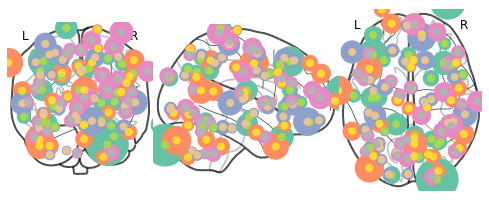

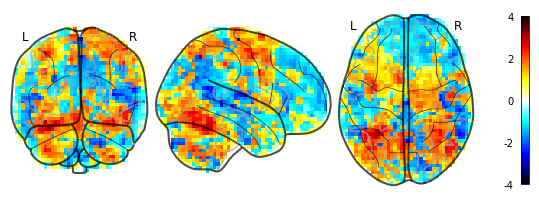

01/24/2020 22:01:34 Reconstruction Error (Frobenius Norm): 9.26014938e+01 out of 6.36484924e+02


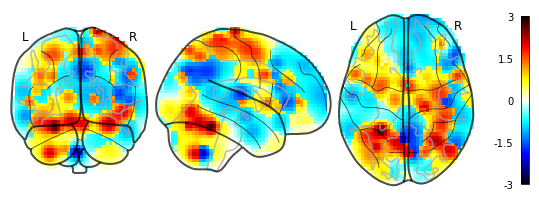

01/24/2020 22:01:35 Reconstruction Error (Frobenius Norm): 3.10809387e+02 out of 6.36484924e+02


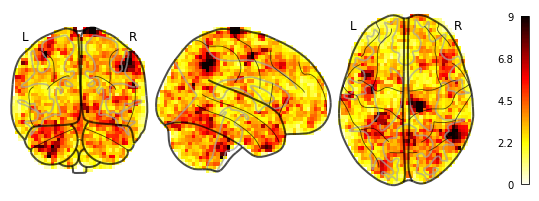

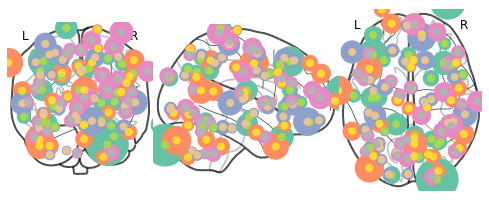

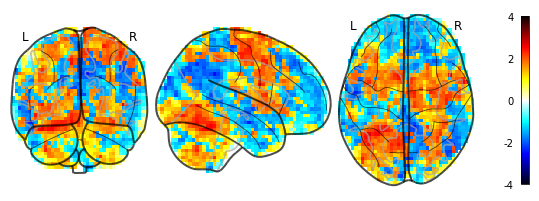

01/24/2020 22:01:38 Reconstruction Error (Frobenius Norm): 9.80419312e+01 out of 6.30872864e+02


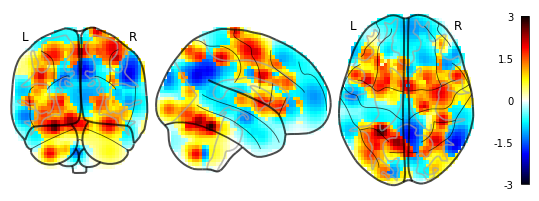

01/24/2020 22:01:39 Reconstruction Error (Frobenius Norm): 2.40836197e+02 out of 6.30872864e+02


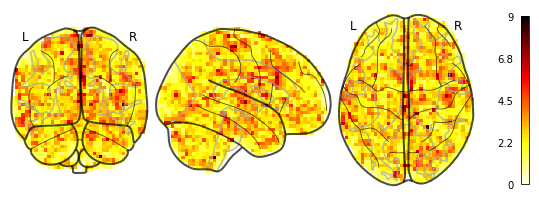

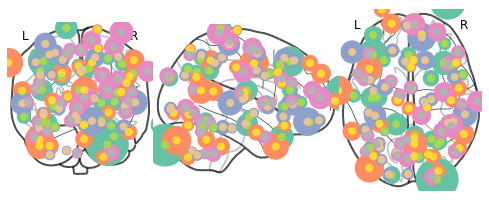

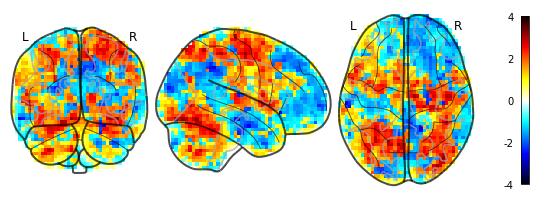

01/24/2020 22:01:42 Reconstruction Error (Frobenius Norm): 9.59287720e+01 out of 6.44300842e+02


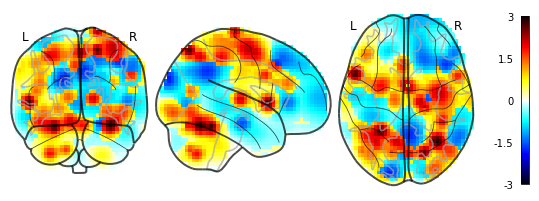

01/24/2020 22:01:44 Reconstruction Error (Frobenius Norm): 2.90280670e+02 out of 6.44300842e+02


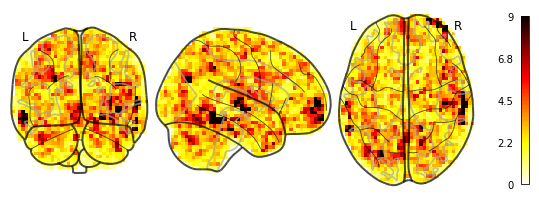

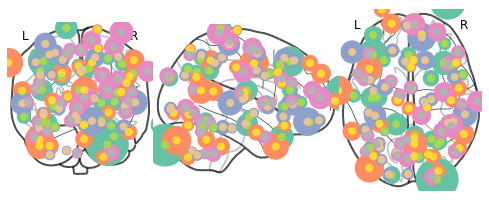

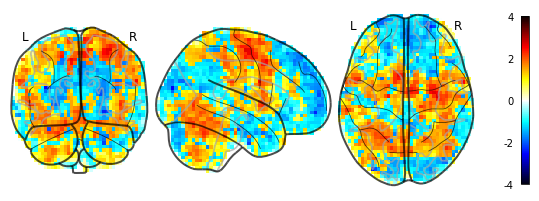

01/24/2020 22:01:46 Reconstruction Error (Frobenius Norm): 8.46620712e+01 out of 6.00198242e+02


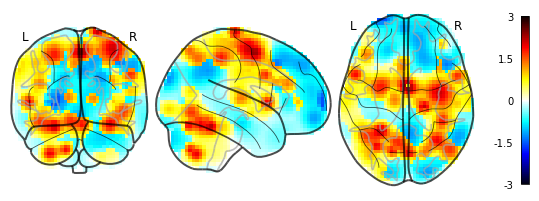

01/24/2020 22:01:48 Reconstruction Error (Frobenius Norm): 2.64453278e+02 out of 6.00198242e+02


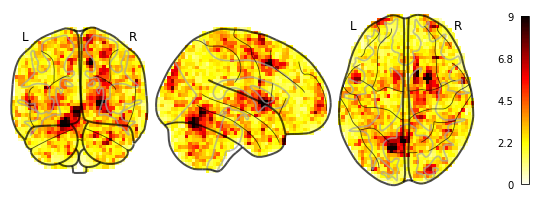

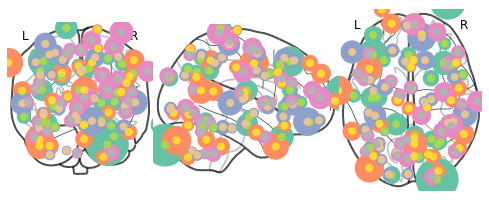

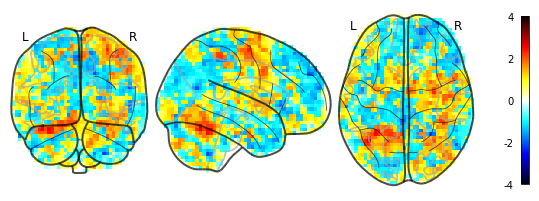

01/24/2020 22:01:51 Reconstruction Error (Frobenius Norm): 7.90900040e+01 out of 5.76843079e+02


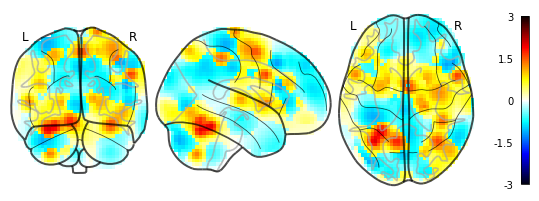

01/24/2020 22:01:52 Reconstruction Error (Frobenius Norm): 2.60129242e+02 out of 5.76843079e+02


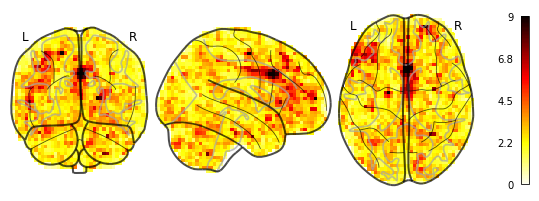

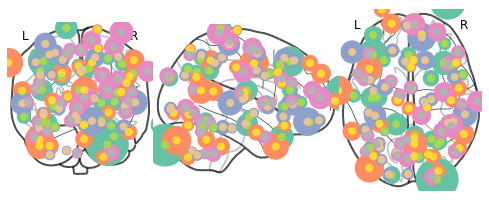

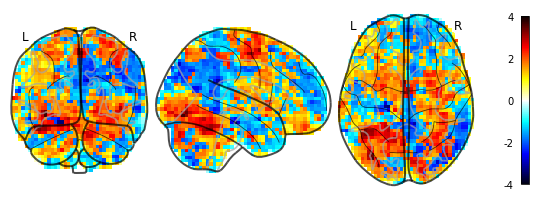

01/24/2020 22:01:55 Reconstruction Error (Frobenius Norm): 1.12951454e+02 out of 6.35086487e+02


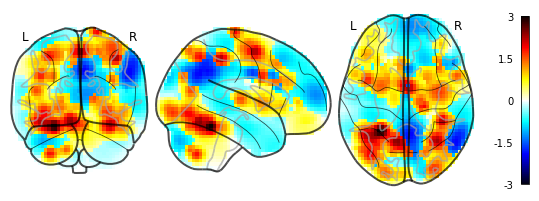

01/24/2020 22:01:56 Reconstruction Error (Frobenius Norm): 2.80732208e+02 out of 6.35086487e+02


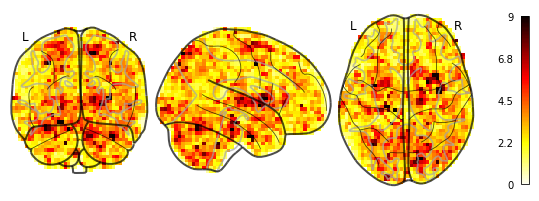

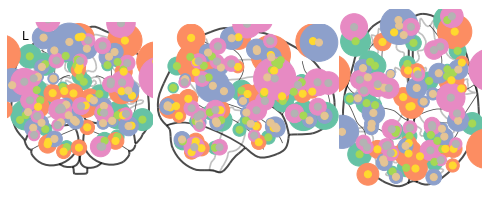

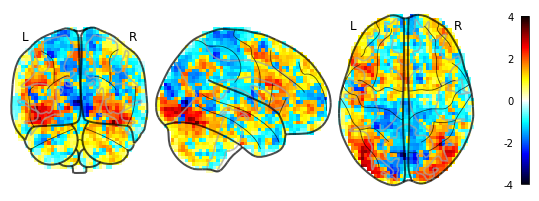

01/24/2020 22:01:59 Reconstruction Error (Frobenius Norm): 9.19957047e+01 out of 6.09614807e+02


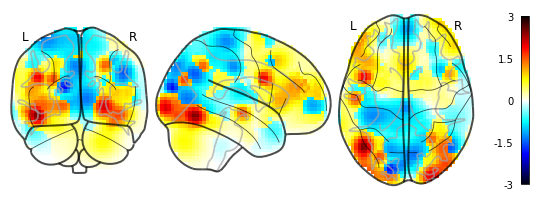

01/24/2020 22:02:00 Reconstruction Error (Frobenius Norm): 2.76472321e+02 out of 6.09614807e+02


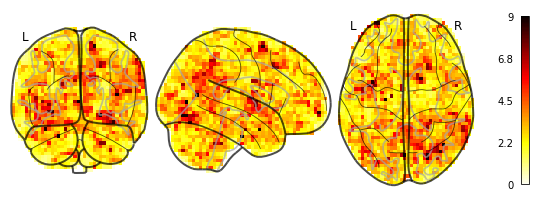

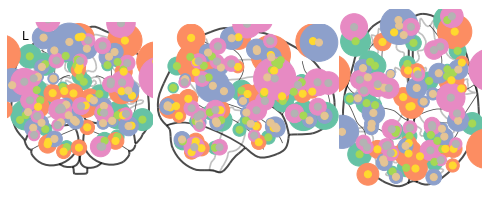

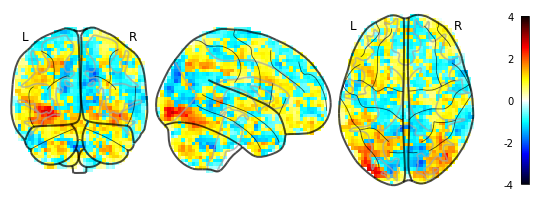

01/24/2020 22:02:03 Reconstruction Error (Frobenius Norm): 7.18140564e+01 out of 5.52729492e+02


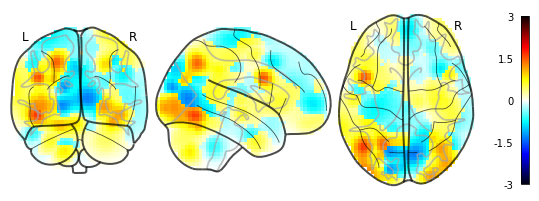

01/24/2020 22:02:05 Reconstruction Error (Frobenius Norm): 2.42961838e+02 out of 5.52729492e+02


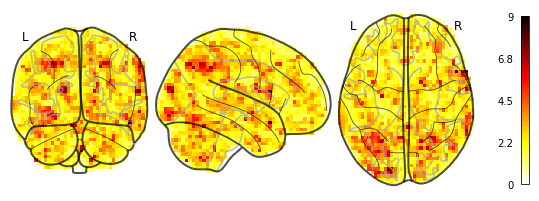

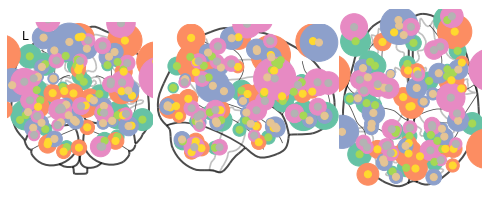

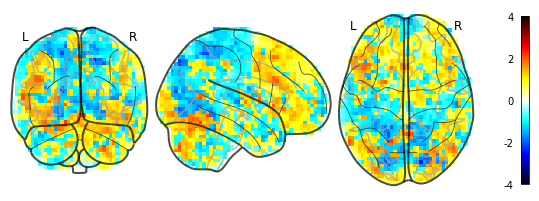

01/24/2020 22:02:07 Reconstruction Error (Frobenius Norm): 8.07958145e+01 out of 5.51140503e+02


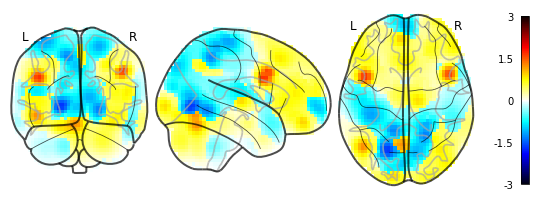

01/24/2020 22:02:09 Reconstruction Error (Frobenius Norm): 2.68896667e+02 out of 5.51140503e+02


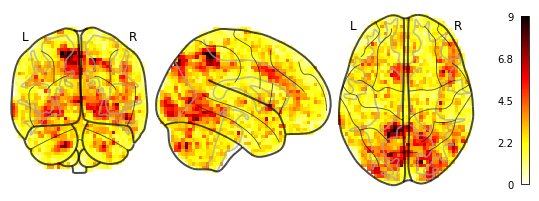

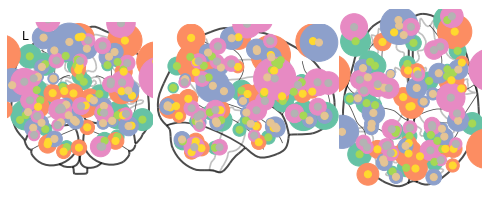

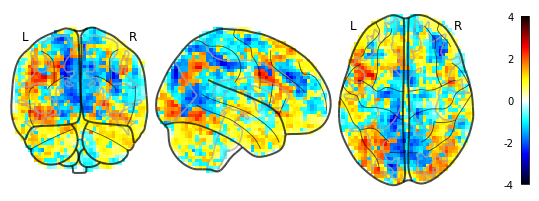

01/24/2020 22:02:12 Reconstruction Error (Frobenius Norm): 8.40289154e+01 out of 5.51951294e+02


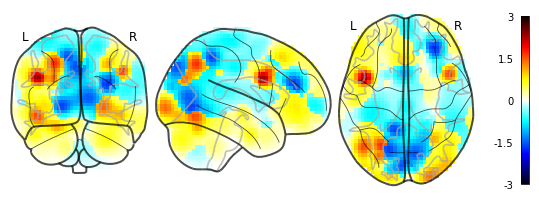

01/24/2020 22:02:13 Reconstruction Error (Frobenius Norm): 2.65412689e+02 out of 5.51951294e+02


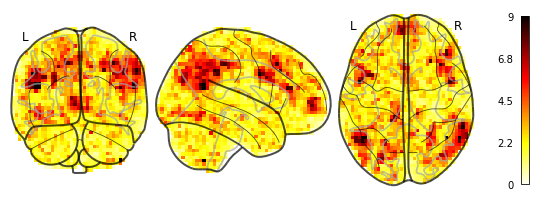

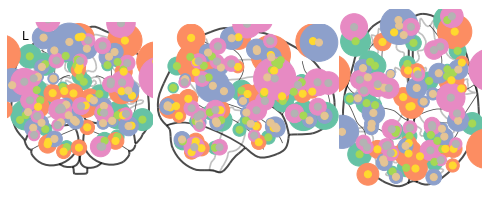

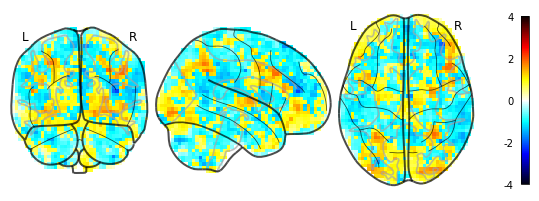

01/24/2020 22:02:16 Reconstruction Error (Frobenius Norm): 7.32384033e+01 out of 5.08276062e+02


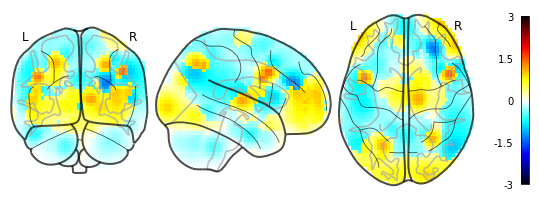

01/24/2020 22:02:17 Reconstruction Error (Frobenius Norm): 2.78855164e+02 out of 5.08276062e+02


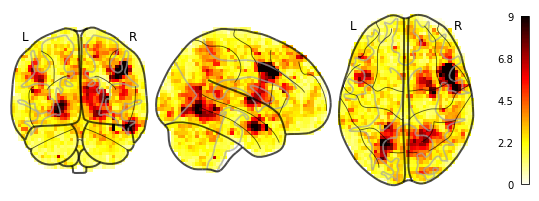

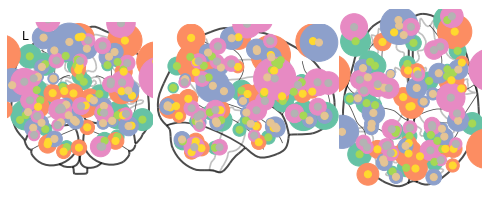

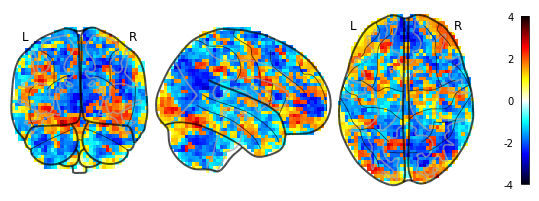

01/24/2020 22:02:20 Reconstruction Error (Frobenius Norm): 1.21507935e+02 out of 6.55966370e+02


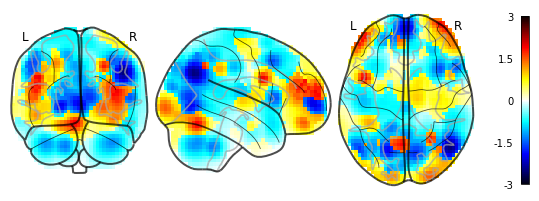

01/24/2020 22:02:21 Reconstruction Error (Frobenius Norm): 2.99546326e+02 out of 6.55966370e+02


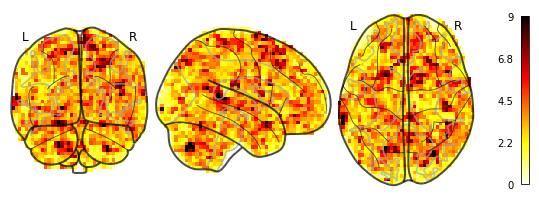

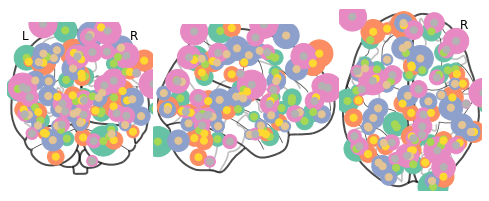

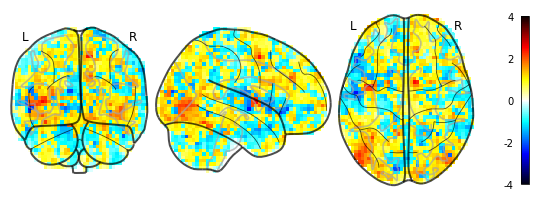

01/24/2020 22:02:24 Reconstruction Error (Frobenius Norm): 8.14937668e+01 out of 5.31463013e+02


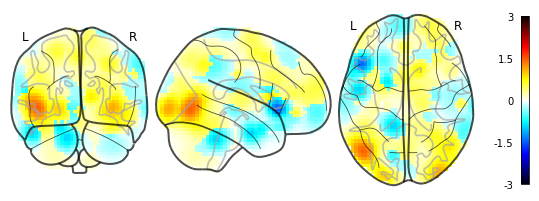

01/24/2020 22:02:25 Reconstruction Error (Frobenius Norm): 3.13915497e+02 out of 5.31463013e+02


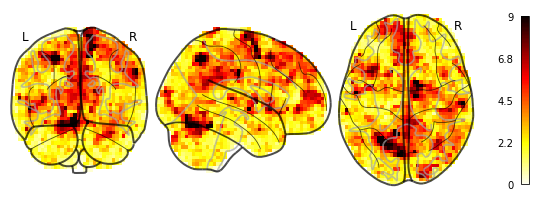

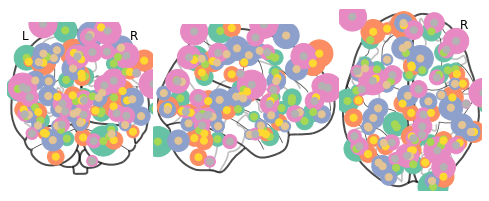

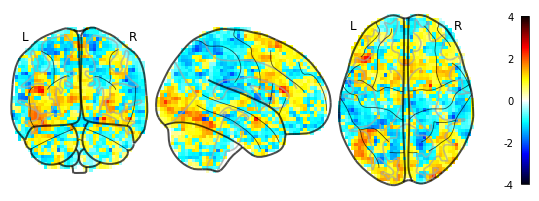

01/24/2020 22:02:28 Reconstruction Error (Frobenius Norm): 7.64737778e+01 out of 5.00539307e+02


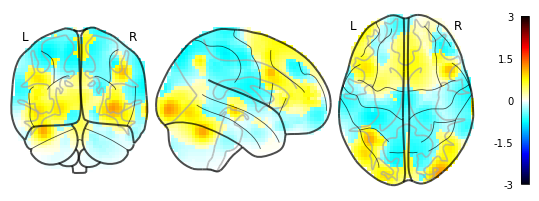

01/24/2020 22:02:30 Reconstruction Error (Frobenius Norm): 2.30217987e+02 out of 5.00539307e+02


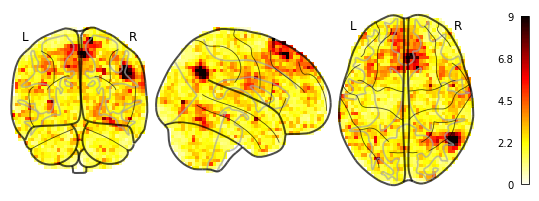

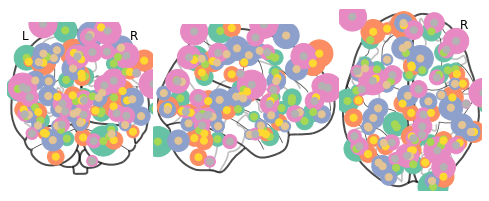

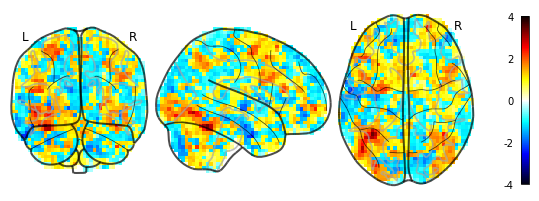

01/24/2020 22:02:33 Reconstruction Error (Frobenius Norm): 8.44459457e+01 out of 5.75106262e+02


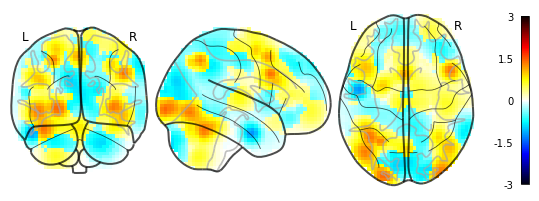

01/24/2020 22:02:34 Reconstruction Error (Frobenius Norm): 2.62587891e+02 out of 5.75106262e+02


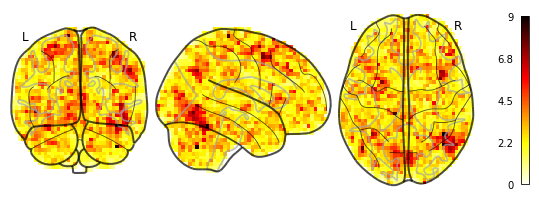

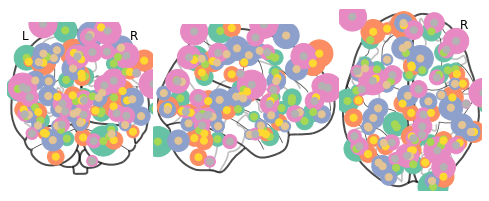

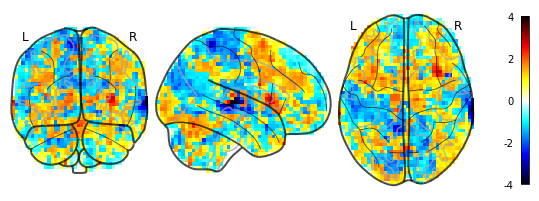

01/24/2020 22:02:37 Reconstruction Error (Frobenius Norm): 9.29795990e+01 out of 5.95553711e+02


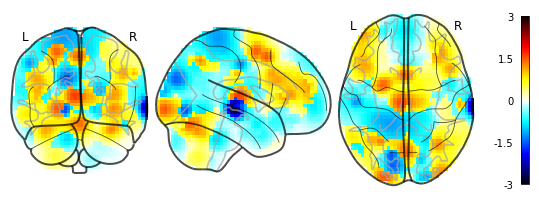

01/24/2020 22:02:38 Reconstruction Error (Frobenius Norm): 3.42069366e+02 out of 5.95553711e+02


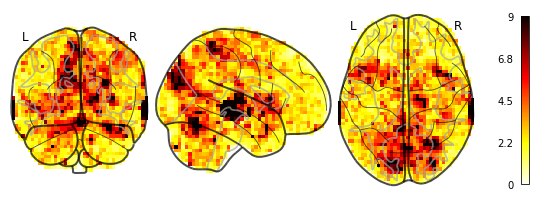

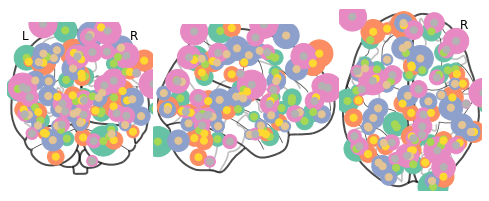

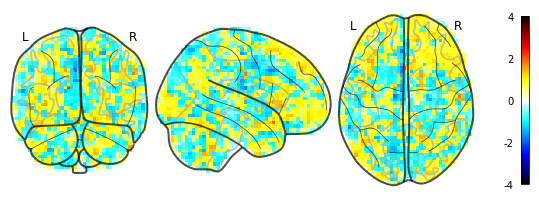

01/24/2020 22:02:41 Reconstruction Error (Frobenius Norm): 7.05253601e+01 out of 4.82947083e+02


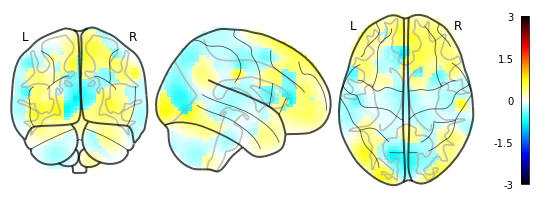

01/24/2020 22:02:43 Reconstruction Error (Frobenius Norm): 2.29243774e+02 out of 4.82947083e+02


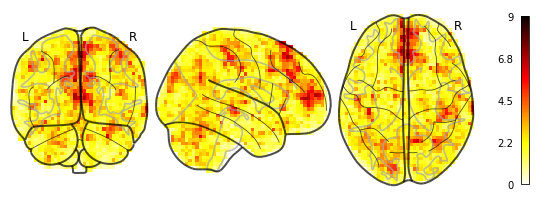

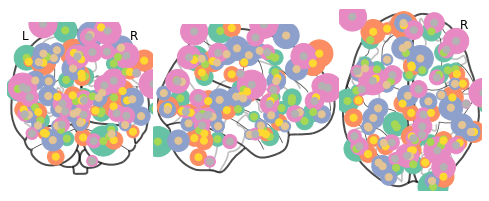

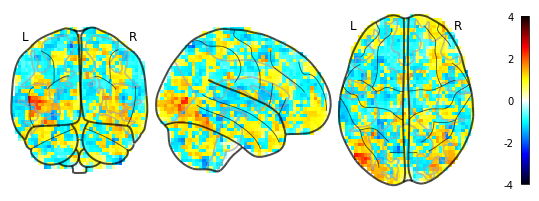

01/24/2020 22:02:46 Reconstruction Error (Frobenius Norm): 8.56158600e+01 out of 5.20422546e+02


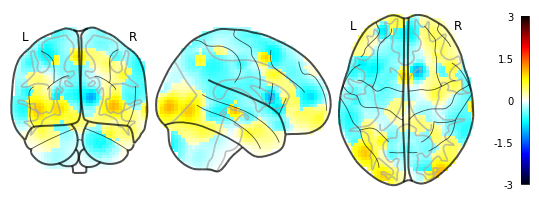

01/24/2020 22:02:47 Reconstruction Error (Frobenius Norm): 2.61689758e+02 out of 5.20422546e+02


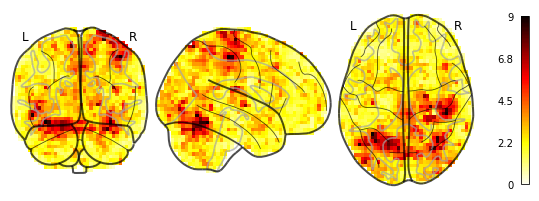

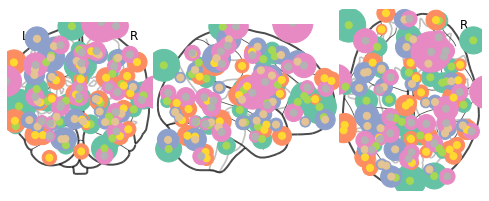

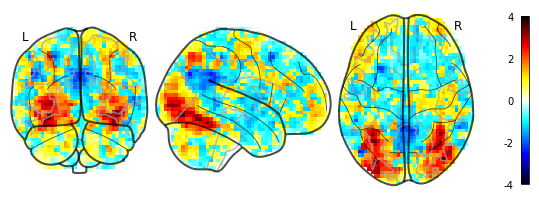

01/24/2020 22:02:50 Reconstruction Error (Frobenius Norm): 7.80540390e+01 out of 5.86504456e+02


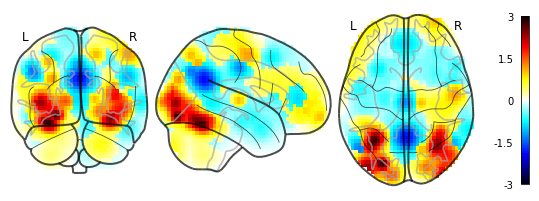

01/24/2020 22:02:51 Reconstruction Error (Frobenius Norm): 2.97463318e+02 out of 5.86504456e+02


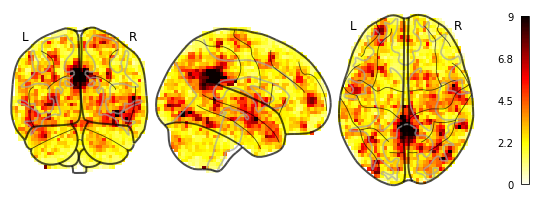

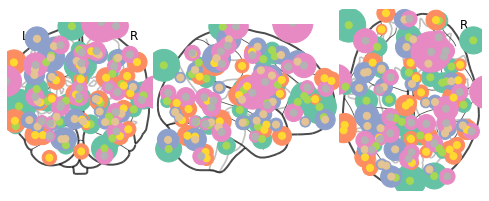

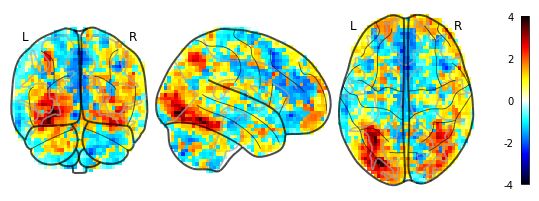

01/24/2020 22:02:54 Reconstruction Error (Frobenius Norm): 8.94293365e+01 out of 6.15271301e+02


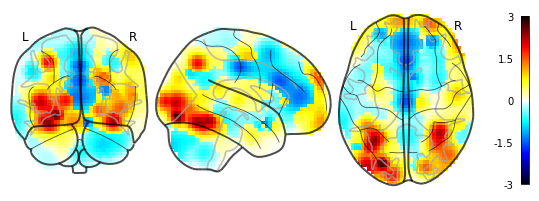

01/24/2020 22:02:55 Reconstruction Error (Frobenius Norm): 2.67254669e+02 out of 6.15271301e+02


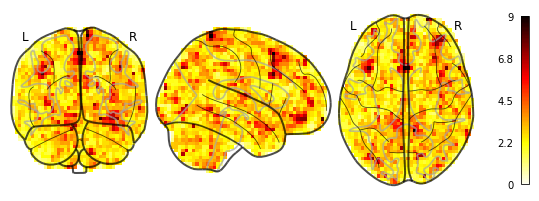

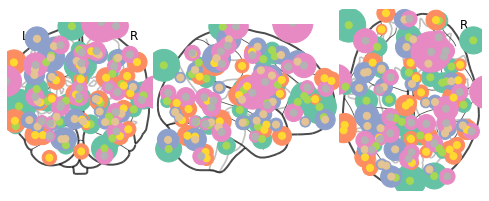

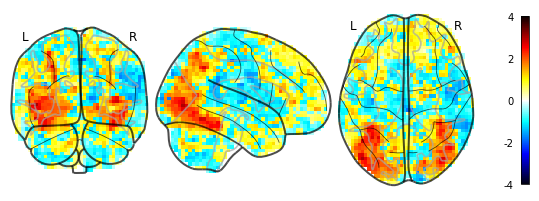

01/24/2020 22:02:58 Reconstruction Error (Frobenius Norm): 7.53537140e+01 out of 5.70584106e+02


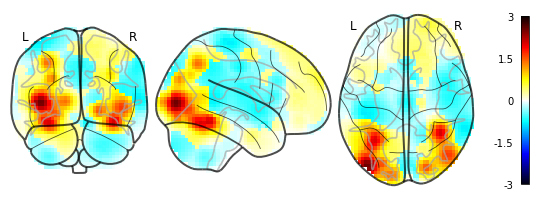

01/24/2020 22:02:59 Reconstruction Error (Frobenius Norm): 2.35972626e+02 out of 5.70584106e+02


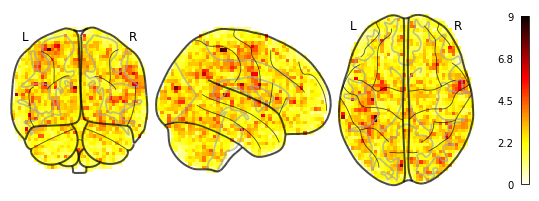

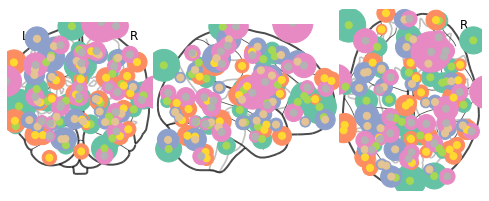

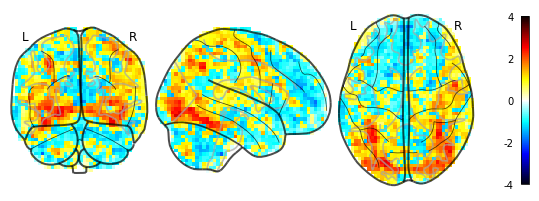

01/24/2020 22:03:02 Reconstruction Error (Frobenius Norm): 7.92879257e+01 out of 5.70172791e+02


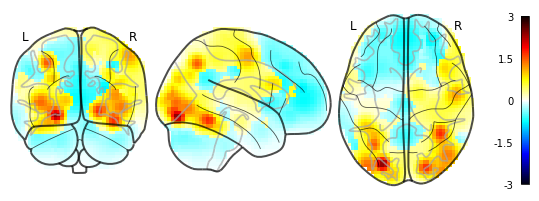

01/24/2020 22:03:03 Reconstruction Error (Frobenius Norm): 2.81556366e+02 out of 5.70172791e+02


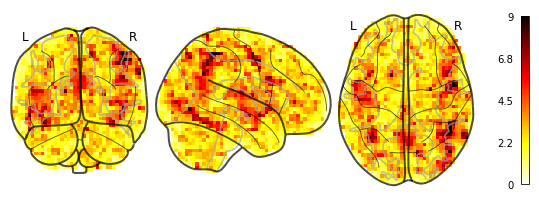

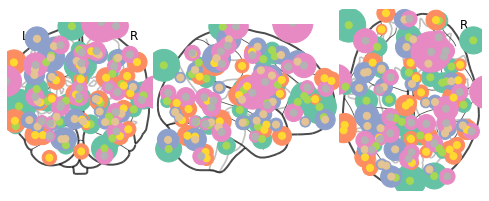

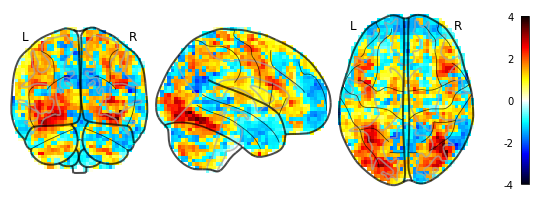

01/24/2020 22:03:06 Reconstruction Error (Frobenius Norm): 9.58084335e+01 out of 6.12698792e+02


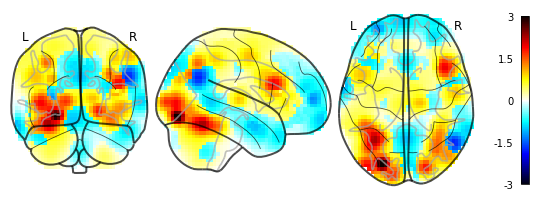

01/24/2020 22:03:08 Reconstruction Error (Frobenius Norm): 3.58944336e+02 out of 6.12698792e+02


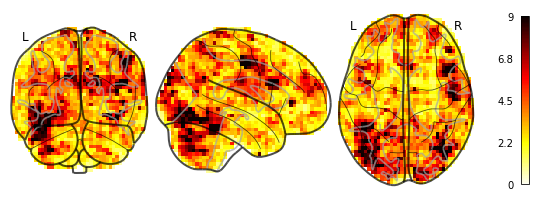

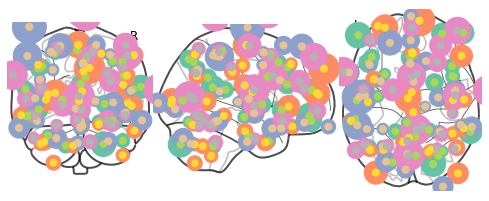

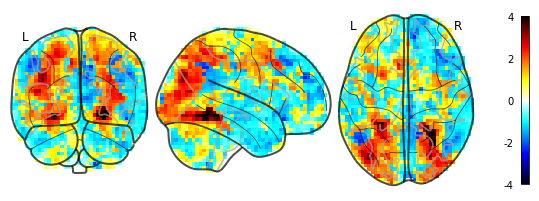

01/24/2020 22:03:11 Reconstruction Error (Frobenius Norm): 9.14236984e+01 out of 6.04306580e+02


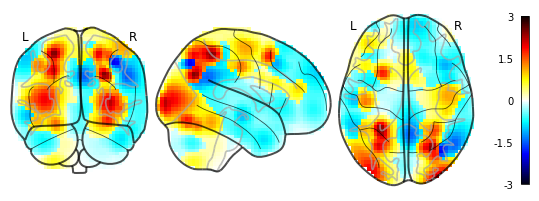

01/24/2020 22:03:12 Reconstruction Error (Frobenius Norm): 2.75766968e+02 out of 6.04306580e+02


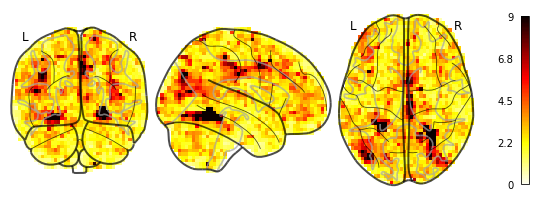

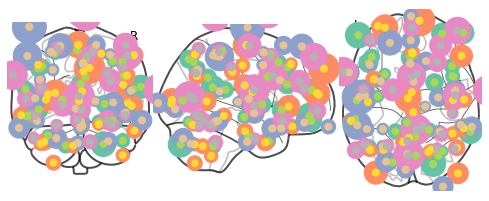

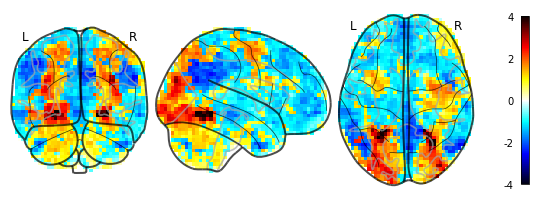

01/24/2020 22:03:15 Reconstruction Error (Frobenius Norm): 9.25780945e+01 out of 6.05236023e+02


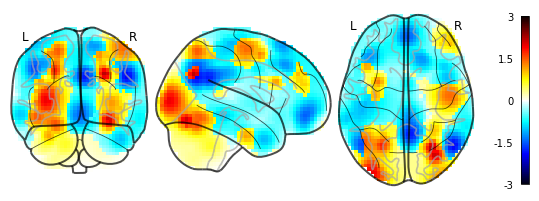

01/24/2020 22:03:16 Reconstruction Error (Frobenius Norm): 3.32914276e+02 out of 6.05236023e+02


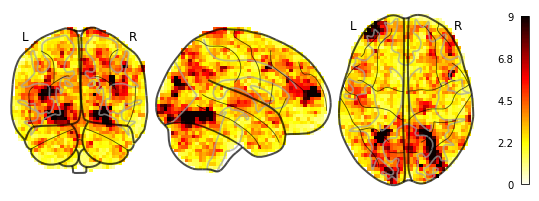

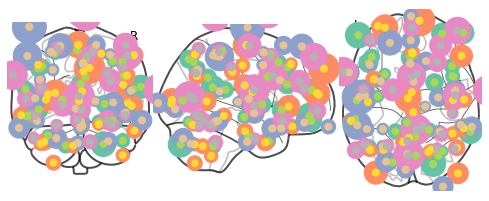

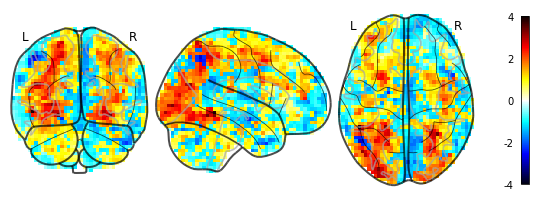

01/24/2020 22:03:19 Reconstruction Error (Frobenius Norm): 8.80205383e+01 out of 5.82021790e+02


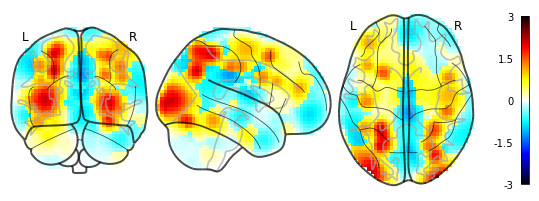

01/24/2020 22:03:21 Reconstruction Error (Frobenius Norm): 3.01583435e+02 out of 5.82021790e+02


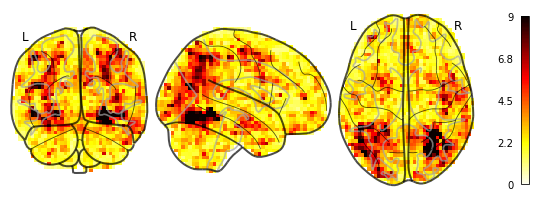

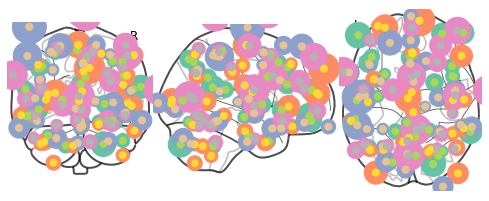

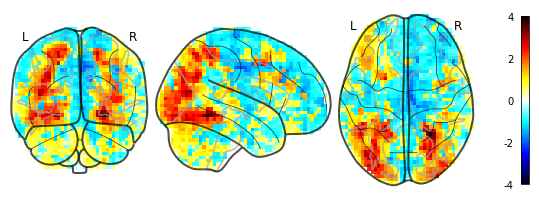

01/24/2020 22:03:24 Reconstruction Error (Frobenius Norm): 7.79948349e+01 out of 5.83054626e+02


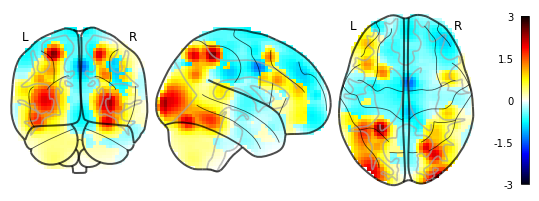

01/24/2020 22:03:25 Reconstruction Error (Frobenius Norm): 2.84360291e+02 out of 5.83054626e+02


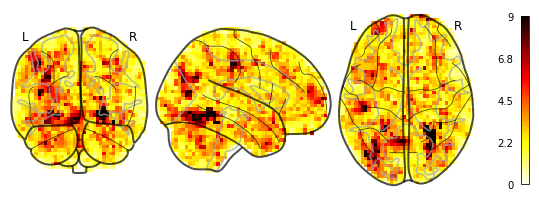

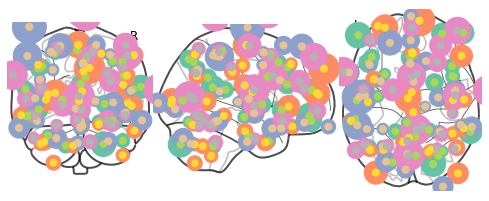

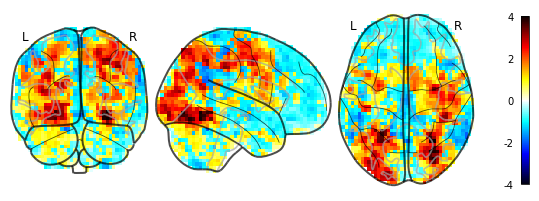

01/24/2020 22:03:28 Reconstruction Error (Frobenius Norm): 8.81218338e+01 out of 5.96572021e+02


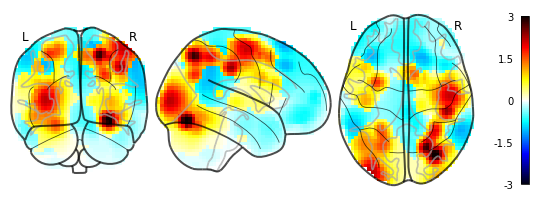

01/24/2020 22:03:29 Reconstruction Error (Frobenius Norm): 2.79625793e+02 out of 5.96572021e+02


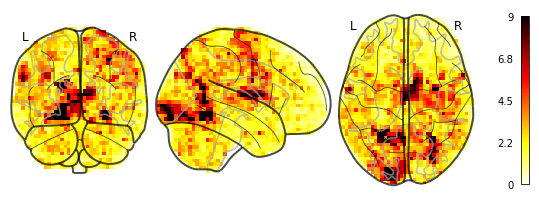

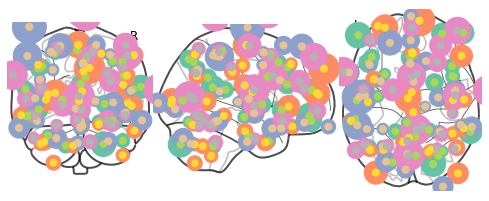

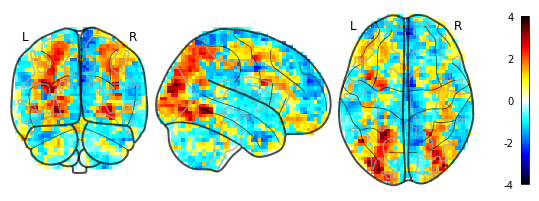

01/24/2020 22:03:32 Reconstruction Error (Frobenius Norm): 8.90830841e+01 out of 5.97426208e+02


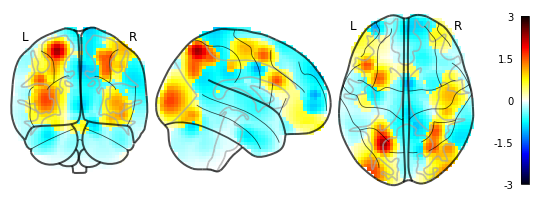

01/24/2020 22:03:33 Reconstruction Error (Frobenius Norm): 2.77090546e+02 out of 5.97426208e+02


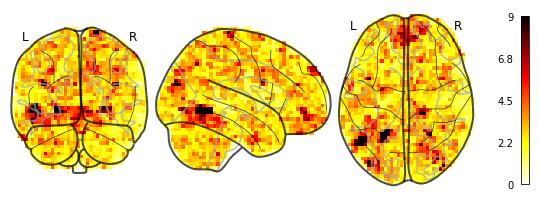

In [17]:
validation_filter = haxby_db.inference_filter(training=False)
validation_blocks = [b for (b, block) in enumerate(dtfa._blocks) if validation_filter(block)]

for index in validation_blocks[0:-1:2]:
    dtfa.plot_factor_centers(index)
    dtfa.plot_original_brain(index, labeler=lambda b: None, zscore_bound=4., t=None)
    dtfa.plot_reconstruction(index, labeler=lambda b: None, t=None)
    dtfa.plot_reconstruction_diff(index, labeler=lambda b: None, t=None)

/home/zulqarnain/develop/htfatorch/htfa_torch/utils.py:147: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


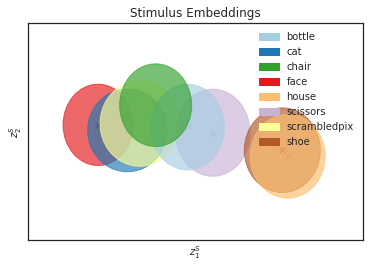

In [20]:
dtfa.scatter_task_embedding(labeler=task_labeler, figsize=None, colormap='Paired',
                            filename='haxby_norest_task_embedding.pdf')

In [21]:
def subject_labeler(subject):
    return 'Subject %d' % subject

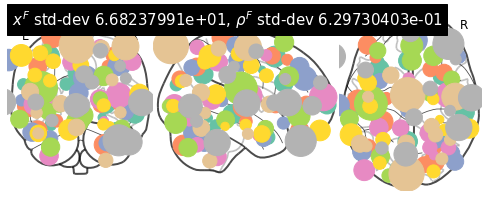

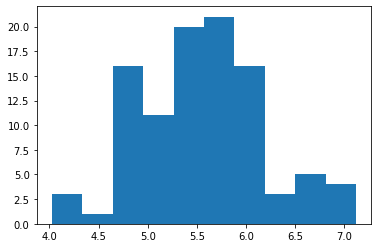

(<nilearn.plotting.displays.OrthoProjector at 0x7f4bdc65d790>,
 tensor([[-5.9713e+01, -2.8171e+01,  2.2149e+01],
         [ 3.8035e+01, -5.8018e+01, -2.4141e+01],
         [ 4.3762e+01,  2.1911e+00,  3.8183e+01],
         [ 2.7153e+01,  7.0455e+01,  1.3235e+00],
         [-2.4136e+00, -5.9676e+01,  3.3623e+01],
         [-3.2857e+01,  2.3995e+01,  4.2220e+00],
         [-3.1109e+01, -4.6712e+01, -2.0438e+01],
         [-3.2834e+01,  1.5622e+01,  5.2150e+01],
         [ 5.7614e+01, -2.9177e+01, -8.4664e+00],
         [ 2.3193e+01, -5.4416e+01, -1.2562e+01],
         [-2.1092e+00,  2.5254e+01,  2.4941e+01],
         [-1.4626e+01, -8.8086e+01,  2.2461e+01],
         [ 3.2365e+01,  7.9043e+00, -3.2630e+01],
         [-2.4861e+01, -1.4749e+01, -1.6126e+01],
         [ 2.9107e+01, -6.4839e+01,  4.1568e+01],
         [-4.4613e+01, -6.6574e+01,  4.1262e+01],
         [ 4.2052e+01,  4.8674e+01,  2.2954e+00],
         [ 2.1642e+01,  1.6382e+01,  9.7163e-01],
         [ 2.5453e+01, -8.0741e+01, -

In [22]:
dtfa.visualize_factor_embedding()

/home/zulqarnain/develop/htfatorch/htfa_torch/utils.py:147: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


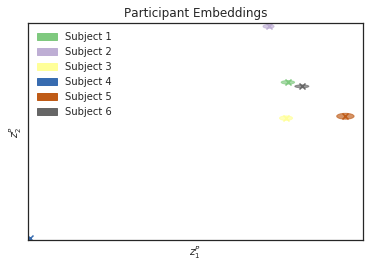

In [23]:
dtfa.scatter_subject_embedding(labeler=subject_labeler, figsize=None)

In [24]:
def subject_task_blocks(subject_label, task_label, subject_labeler=subject_labeler, task_labeler=task_labeler):
    for b in dtfa._blocks:
        if subject_labeler(b.subject) == subject_label and task_labeler(b.task) == task_label:
            yield b

In [25]:
def subject_blocks(subject_label, subject_labeler=subject_labeler):
    for b in dtfa._blocks:
        if subject_labeler(b.subject) == subject_label:
            yield b

In [55]:
### this is still Work in Progress ###
from scipy.spatial import distance
hyperparams = dtfa.variational.hyperparams.state_vardict()
all_weights = hyperparams['weights']['mu'].data.numpy()
all_factor_centers = hyperparams['factor_centers']['mu'].data.numpy()
all_factor_widths = np.exp(hyperparams['factor_log_widths']['mu'].data.numpy())
face_matrix = []
house_matrix = []
for i in range(dtfa.num_blocks):
    if block_task_labeler(dtfa._blocks[i]) == 'face':
        face_matrix.append(np.corrcoef(all_weights[i,:,:].T))
    elif  block_task_labeler(dtfa._blocks[i]) == 'house':
        house_matrix.append(np.corrcoef(all_weights[i,:,:].T))

face_matrix = (np.array(face_matrix))
house_matrix = (np.array(house_matrix))

face_matrix[face_matrix < 0] = 0
house_matrix[house_matrix < 0] = 0

face_vectors = np.zeros(shape=(face_matrix.shape[0],4950))
for i in range(face_matrix.shape[0]):
    face_vectors[i,:] = distance.squareform(face_matrix[i,:,:],checks=False)

house_vectors = np.zeros(shape=(house_matrix.shape[0],4950))
for i in range(house_matrix.shape[0]):
    house_vectors[i,:] = distance.squareform(house_matrix[i,:,:],checks=False)
    
face_vectors_mean = face_vectors.mean(0)
house_vectors_std = house_vectors.std(0)


In [56]:
### face vs house ###
p_original = []
t_original = []
significance_flags = np.zeros(4950,)
for i in range(4950):
    t,p = stats.ttest_ind(face_vectors[:,i],house_vectors[:,i])
    p_original.append(p)
    t_original.append(t)
p_corrected = smt.multipletests(p_original,method='fdr_by')[1]
for i in range(4950):
    if p_corrected[i] < 0.05 and t_original[i]>0:
        significance_flags[i] = 1
significant_edges = significance_flags.sum()
significance_flags =distance.squareform(significance_flags)
use_factors = np.where(significance_flags.sum(0) > 0)[0]
node_sizes = np.zeros(100,)
node_sizes[use_factors] = all_factor_widths[0,use_factors]
face_connectome = distance.squareform(face_vectors_mean) * significance_flags
if significant_edges > 0:
    niplot.plot_connectome(face_connectome,all_factor_centers[0,:,:],node_size=node_sizes,
                       colorbar=True,title='spider-heights-'+str(significant_edges))#,edge_threshold="75%")
else:
    print('no significant edges found')

no significant edges found


In [36]:
### task classification using leave one out runs ###
from sklearn.svm import SVC
classifier = SVC(C=1., kernel="linear")

# A classifier to set the chance level
from sklearn.dummy import DummyClassifier
dummy_classifier = DummyClassifier()

# Make a data splitting object for cross validation
from sklearn.model_selection import LeaveOneGroupOut, cross_val_score
cv = LeaveOneGroupOut()

for s in dtfa.subjects():
    print("Processing Subject %d" % (s))
    session_labels = []
    data = []
    targets = []
    for i in range(dtfa.num_blocks):
        block = dtfa._blocks[i]
        if block.subject == s:
            session_labels.append(block.run)
            data.append(all_weights[i,:,:].mean(0))
            targets.append(task_labeler(block.task))
    data = np.array(data)
    categories = np.unique(targets)

    for category in categories:
        print("Processing %s" % (category))
        classification_target = [t==category for t in targets]
        result = cross_val_score(
            classifier,
            data,
            classification_target,
            cv=cv,
            groups=session_labels,
#             scoring="roc_auc",
        )

        result_chance = cross_val_score(
            dummy_classifier,
            data,
            classification_target,
            cv=cv,
            groups=session_labels,
#             scoring="roc_auc",
        )

        print("Scores: %1.2f +- %1.2f" % (
            result.mean(),
            result.std()))

        print("Chance Scores: %1.2f +- %1.2f" % (
            result_chance.mean(),
            result_chance.std()))
        
    print ("\n")

Processing Subject 1
Processing bottle
Scores: 0.83 +- 0.17
Chance Scores: 0.82 +- 0.12
Processing cat
Scores: 0.88 +- 0.08
Chance Scores: 0.85 +- 0.09
Processing chair
Scores: 0.92 +- 0.08
Chance Scores: 0.70 +- 0.17
Processing face
Scores: 0.94 +- 0.08
Chance Scores: 0.73 +- 0.10
Processing house
Scores: 0.99 +- 0.04
Chance Scores: 0.81 +- 0.15
Processing scissors
Scores: 0.89 +- 0.08
Chance Scores: 0.78 +- 0.09
Processing scrambledpix
Scores: 0.95 +- 0.06
Chance Scores: 0.77 +- 0.10
Processing shoe
Scores: 0.89 +- 0.10
Chance Scores: 0.75 +- 0.09


Processing Subject 2
Processing bottle
Scores: 0.84 +- 0.12
Chance Scores: 0.84 +- 0.07
Processing cat
Scores: 0.91 +- 0.09
Chance Scores: 0.78 +- 0.07
Processing chair
Scores: 0.83 +- 0.11
Chance Scores: 0.79 +- 0.13
Processing face
Scores: 0.96 +- 0.06
Chance Scores: 0.82 +- 0.09
Processing house
Scores: 0.97 +- 0.05
Chance Scores: 0.80 +- 0.13
Processing scissors
Scores: 0.96 +- 0.06
Chance Scores: 0.80 +- 0.08
Processing scrambledpix


In [37]:
data = all_weights.mean(1)
targets = []
subject_labels = []
session_labels = []
for i in range(dtfa.num_blocks):
    block = dtfa._blocks[i]
    session_labels.append(block.run)
    targets.append(task_labeler(block.task))
    subject_labels.append(block.subject)
categories = np.unique(targets)
for category in categories:
    print("Processing %s" % (category))
    classification_target = [t==category for t in targets]
    result = cross_val_score(
        classifier,
        data,
        classification_target,
        cv=cv,
        groups=subject_labels,
#         scoring="roc_auc",
    )

    result_chance = cross_val_score(
        dummy_classifier,
        data,
        classification_target,
        cv=cv,
        groups=subject_labels,
#         scoring="roc_auc",
    )

    print("Scores: %1.2f +- %1.2f" % (
        result.mean(),
        result.std()))

    print("Chance Scores: %1.2f +- %1.2f" % (
        result_chance.mean(),
        result_chance.std()))

Processing bottle
Scores: 0.75 +- 0.22
Chance Scores: 0.79 +- 0.04
Processing cat
Scores: 0.59 +- 0.29
Chance Scores: 0.79 +- 0.03
Processing chair
Scores: 0.67 +- 0.22
Chance Scores: 0.78 +- 0.05
Processing face
Scores: 0.65 +- 0.31
Chance Scores: 0.78 +- 0.03
Processing house
Scores: 0.81 +- 0.12
Chance Scores: 0.78 +- 0.04
Processing scissors
Scores: 0.65 +- 0.20
Chance Scores: 0.78 +- 0.02
Processing scrambledpix
Scores: 0.86 +- 0.06
Chance Scores: 0.78 +- 0.02
Processing shoe
Scores: 0.78 +- 0.12
Chance Scores: 0.79 +- 0.04


In [38]:
from sklearn.feature_selection import SelectPercentile, f_classif
feature_selection = SelectPercentile(f_classif, percentile=5)
from sklearn.pipeline import Pipeline
svc = SVC(C=1., kernel="linear")
classifier = Pipeline([('anova', feature_selection), ('svc', svc)])
data = all_weights.mean(1)
targets = []
subject_labels = []
session_labels = []
data = []
for i in range(dtfa.num_blocks):
    block = dtfa._blocks[i]
    session_labels.append(block.run)
    targets.append(task_labeler(block.task))
    data.append(dtfa.voxel_activations[i].data.numpy().mean(0))
    subject_labels.append(block.subject)
categories = np.unique(targets)
for category in categories:
    print("Processing %s" % (category))
    classification_target = [t==category for t in targets]
    result = cross_val_score(
        classifier,
        data,
        classification_target,
        cv=cv,
        groups=subject_labels,
#         scoring="roc_auc",
    )

    result_chance = cross_val_score(
        dummy_classifier,
        data,
        classification_target,
        cv=cv,
        groups=subject_labels,
#         scoring="roc_auc",
    )

    print("Scores: %1.2f +- %1.2f" % (
        result.mean(),
        result.std()))

    print("Chance Scores: %1.2f +- %1.2f" % (
        result_chance.mean(),
        result_chance.std()))

Processing bottle
Scores: 0.84 +- 0.04
Chance Scores: 0.79 +- 0.03
Processing cat
Scores: 0.79 +- 0.13
Chance Scores: 0.78 +- 0.02
Processing chair
Scores: 0.79 +- 0.11
Chance Scores: 0.78 +- 0.02
Processing face
Scores: 0.86 +- 0.03
Chance Scores: 0.76 +- 0.01
Processing house
Scores: 0.94 +- 0.03
Chance Scores: 0.79 +- 0.03
Processing scissors
Scores: 0.85 +- 0.07
Chance Scores: 0.77 +- 0.03
Processing scrambledpix
Scores: 0.93 +- 0.02
Chance Scores: 0.75 +- 0.02
Processing shoe
Scores: 0.83 +- 0.08
Chance Scores: 0.77 +- 0.02


In [39]:
for s in dtfa.subjects():
    print("Processing Subject %d" % (s))
    session_labels = []
    data = []
    targets = []
    for i in range(dtfa.num_blocks):
        block = dtfa._blocks[i]
        if block.subject == s:
            session_labels.append(block.run)
            data.append(dtfa.voxel_activations[i].data.numpy().mean(0))
            targets.append(task_labeler(block.task))
    data = np.array(data)
    categories = np.unique(targets)

    for category in categories:
        print("Processing %s" % (category))
        classification_target = [t==category for t in targets]
        result = cross_val_score(
            classifier,
            data,
            classification_target,
            cv=cv,
            groups=session_labels,
#             scoring="roc_auc",
        )

        result_chance = cross_val_score(
            dummy_classifier,
            data,
            classification_target,
            cv=cv,
            groups=session_labels,
#             scoring="roc_auc",
        )

        print("Scores: %1.2f +- %1.2f" % (
            result.mean(),
            result.std()))

        print("Chance Scores: %1.2f +- %1.2f" % (
            result_chance.mean(),
            result_chance.std()))
        
    print ("\n")

Processing Subject 1
Processing bottle
Scores: 0.90 +- 0.10
Chance Scores: 0.80 +- 0.11
Processing cat
Scores: 0.92 +- 0.08
Chance Scores: 0.80 +- 0.10
Processing chair
Scores: 0.91 +- 0.06
Chance Scores: 0.80 +- 0.10
Processing face
Scores: 0.98 +- 0.05
Chance Scores: 0.81 +- 0.10
Processing house
Scores: 1.00 +- 0.00
Chance Scores: 0.80 +- 0.13
Processing scissors
Scores: 0.88 +- 0.00
Chance Scores: 0.80 +- 0.08
Processing scrambledpix
Scores: 0.95 +- 0.06
Chance Scores: 0.76 +- 0.14
Processing shoe
Scores: 0.90 +- 0.07
Chance Scores: 0.78 +- 0.13


Processing Subject 2
Processing bottle
Scores: 0.91 +- 0.05
Chance Scores: 0.79 +- 0.13
Processing cat
Scores: 0.91 +- 0.07
Chance Scores: 0.79 +- 0.08
Processing chair
Scores: 0.90 +- 0.07
Chance Scores: 0.75 +- 0.14
Processing face
Scores: 0.95 +- 0.06
Chance Scores: 0.77 +- 0.11
Processing house
Scores: 1.00 +- 0.00
Chance Scores: 0.77 +- 0.10
Processing scissors
Scores: 0.88 +- 0.09
Chance Scores: 0.79 +- 0.11
Processing scrambledpix
